# Facemo
## Recreating an image with a mosaic of other images

#### Import Modules

In [1]:
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import image
import glob, os
import math
from scipy import spatial
import random 

#### Function: Get a numpy array from an image file location

In [2]:
def load_image(source : str) -> np.ndarray:
    ''' Opens an image from specified source and returns a numpy array with image data
    '''
    with Image.open(source) as im:
        im_arr = np.asarray(im)
    return im_arr

#### Load our main image

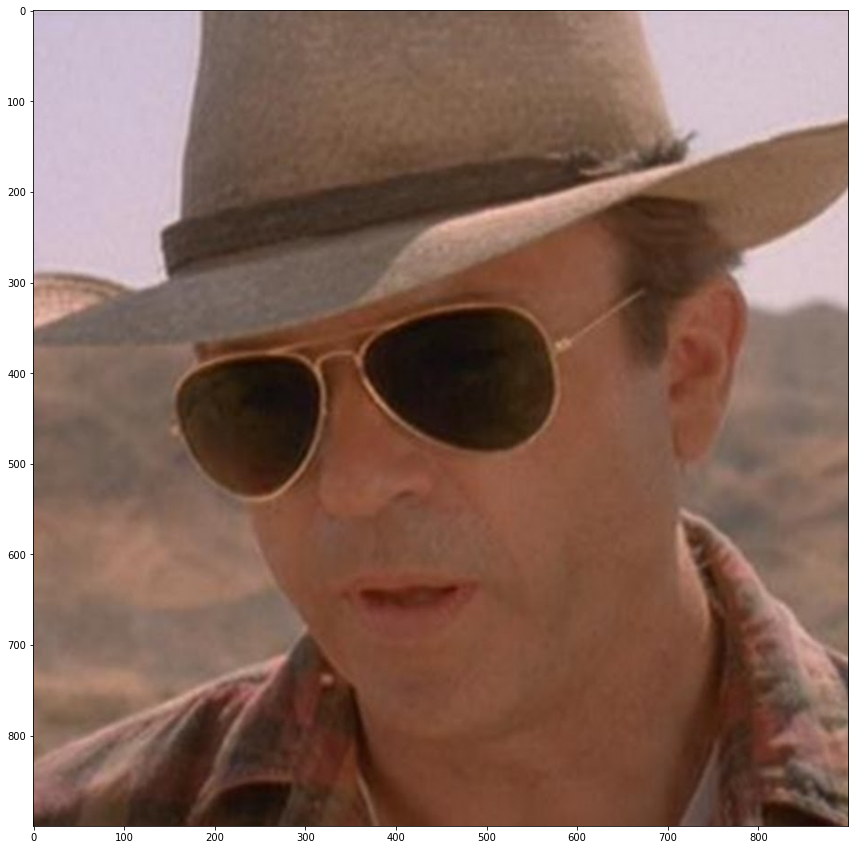

In [3]:
plt.figure(figsize=(15,15))
face_im_arr = load_image('../Images/face-image.jpg')
face_image = Image.fromarray(face_im_arr)
plt.imshow(face_image)

#### Create a template for mosaic
Index slice the image, using the step for rows and columns to divide the resolution

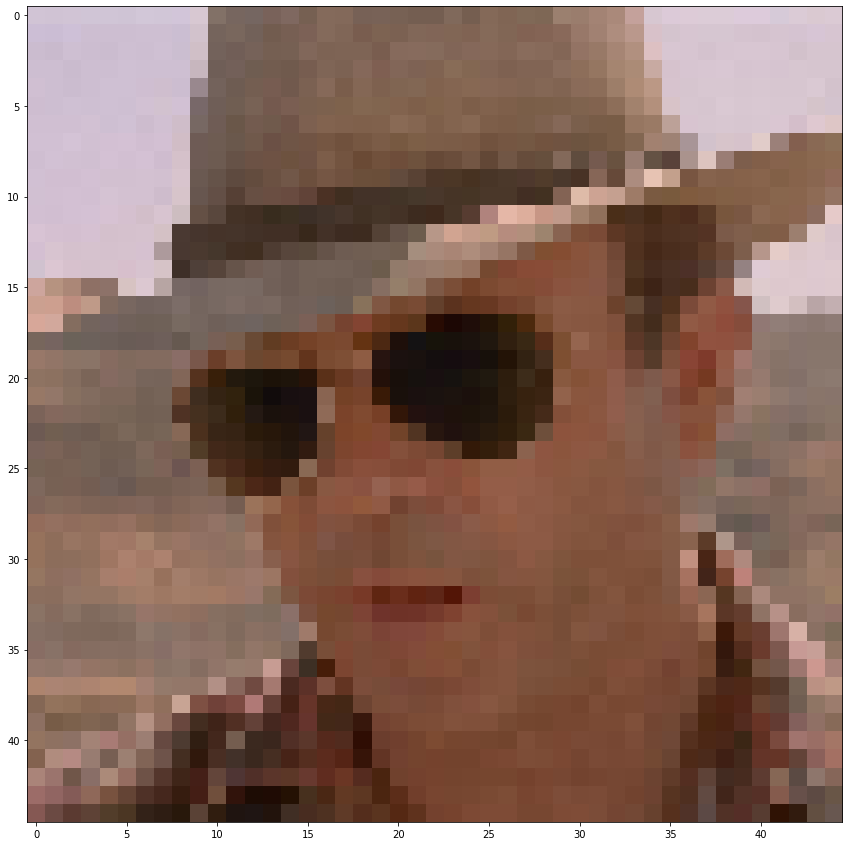

In [4]:
plt.figure(figsize=(15,15))
mos_template = face_im_arr[::20,::20]
plt.imshow(Image.fromarray(mos_template))

#### Number of images required to fill mosaic

In [5]:
mos_template[:,:, -1].size

2025

#### Create a list of all images as np arrays

In [6]:
images = []

for file in glob.glob('../Images/Mosaic-Images/*'):
    im = load_image(file)
    images.append(im)

#### Delete any images with unexpected shapes
Not quite sure why these images have shapes of (100,100), but there were only a few, so I'll bin them
Also halving the resolution of every image - luckily all of my images are the same res so don't need to crop or resize them initially

In [7]:
images = [i[::2, ::2] for i in images if i.shape==(100, 100, 3)]

#### Number of images in list

In [8]:
len(images)

1071

#### Let's take a look at one of the mosaic images

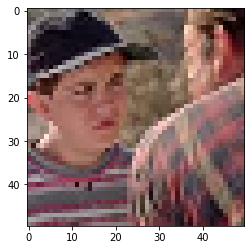

In [10]:
plt.imshow(Image.fromarray(images[68]))

#### Convert list to np array

In [11]:
images_array = np.asarray(images)
images_array.shape

(1071, 50, 50, 3)

#### Get mean of RGB values for each image
This will store the mean Red, Green and Blue values of each mosaic image

In [13]:
image_values = np.apply_over_axes(np.mean, images_array, [1,2]).reshape(1071,3)
image_values

array([[ 87.0388,  72.2496,  58.9892],
       [ 46.3792,  38.6156,  42.9328],
       [100.4292,  80.2744,  82.8932],
       ...,
       [ 39.64  ,  33.0524,  35.9888],
       [112.0964,  80.5084,  76.412 ],
       [ 84.6704,  68.4236,  66.9392]])

In [22]:
image_idx = np.zeros((45, 45), dtype=np.uint32)


for i in range(45):
    for j in range(45):
        
        template = mos_template[i, j]
        
        match = tree.query(template, k=40)
        pick = random.randint(0, 39)
        image_idx[i, j] = match[1][pick]

In [23]:
image_idx

array([[134, 330, 586, ..., 777, 302, 518],
       [696, 261,  96, ..., 586, 691, 636],
       [ 22, 586, 884, ..., 158, 492, 466],
       ...,
       [133, 199, 941, ..., 155, 494, 319],
       [662, 494,  28, ..., 639, 639, 192],
       [874, 174, 896, ..., 766, 472,   2]], dtype=uint32)

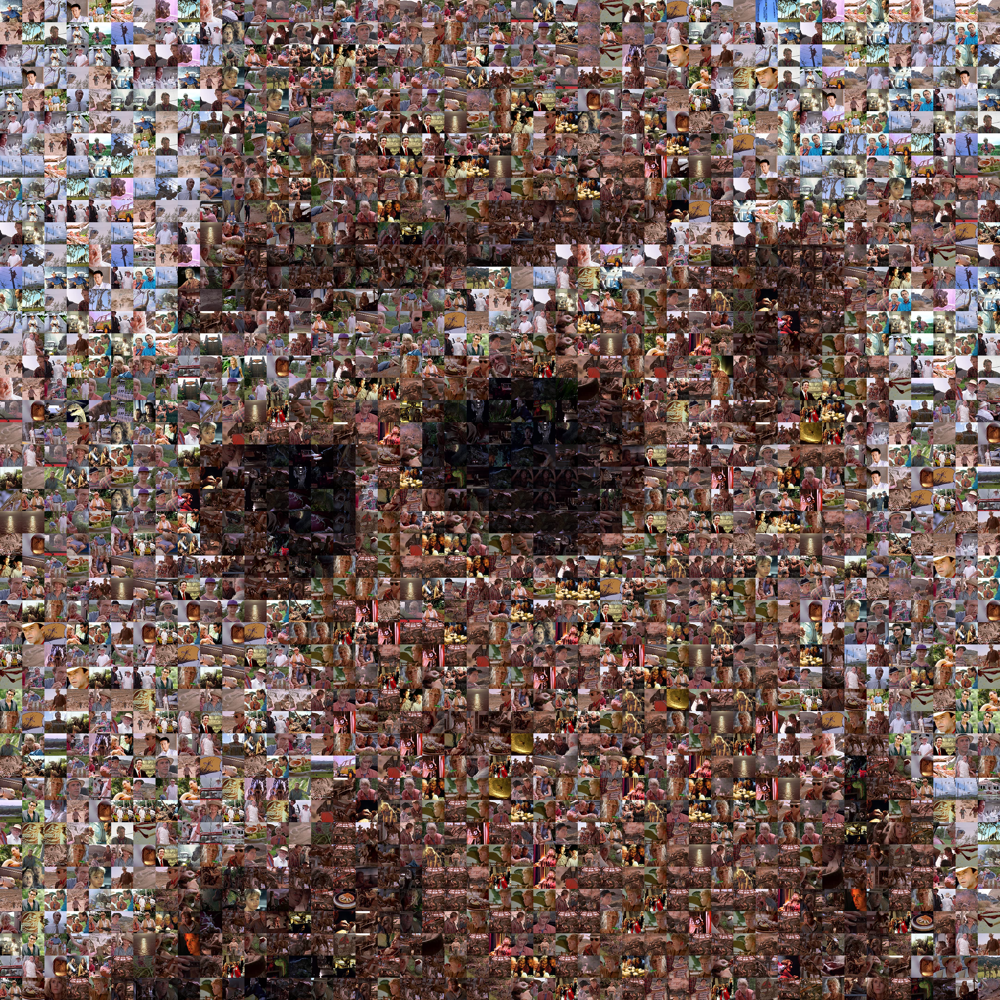

In [24]:
output = Image.new('RGB', (2250, 2250))

l = []

for i in range(45):
    for j in range(45):
        arr = images[image_idx[j, i]]
        x, y = i*50, j*50
        im = Image.fromarray(arr)
        output.paste(im, (x,y))
        
output